In [1]:
import glob
import shutil
import os
import cv2
import imageio
import numpy as np
import pandas as pd


from tqdm import tqdm
import imageio.v2 as imageio

#from glob import glob

import torch

import random


import pretrained_microscopy_models as pmm
import segmentation_models_pytorch as smp
import albumentations as albu
from skimage import img_as_ubyte
from skimage.color import gray2rgb

from pathlib import Path
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

import json
import pickle


from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import r2_score  
from sklearn.metrics import mean_squared_error as mse

import matplotlib as mpl# random_state = 36
import matplotlib.pyplot as plt
from matplotlib import  style

from codes.utils_segmentation import make_inference, segmentation_models_inference, iou, iou_value, cov_value

#orig_data_dir = 'Data/segmentation_2023-09-15'

DATA_DIR = 'Data/segmentation_data'

# define names for train / val / test subfolders
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_annot')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_annot')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_annot')

# check results
for subdir in [x_train_dir, y_train_dir, x_valid_dir, y_valid_dir, x_test_dir, y_test_dir]:
    image_files = glob.glob(os.path.join(subdir, '*.png'))
    print(f'{len(image_files)} unique images in {subdir}')

890 unique images in Data/segmentation_data/train
890 unique images in Data/segmentation_data/train_annot
100 unique images in Data/segmentation_data/val
100 unique images in Data/segmentation_data/val_annot
115 unique images in Data/segmentation_data/test
115 unique images in Data/segmentation_data/test_annot


In [2]:



def get_training_augmentation(prob=0.3, power=1):
    """Need to make sure image shape is divisible by 32"""
    train_transform = [
       # albu.HorizontalFlip(p=0.5),
     #   albu.VerticalFlip(p=0.5),

    ]

    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Need to make sure image shape is divisible by 32"""
    test_transform = [
 
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)


In [3]:
# model parameters
architecture = 'UnetPlusPlus'

encoder = 'se_resnext50_32x4d'
# pretrained_weights = 'micronet'

#encoder = 'resnet18'
# pretrained_weights = 'none'
pretrained_weights = 'micronet'

device = 'cuda:1' if torch.cuda.is_available() else 'cpu'
print(device)

# Create the UnetPlusPlus model with a se_resnext50_32x4d backbone 
# that is pre-trained on micronet
model = pmm.segmentation_training.create_segmentation_model(
    architecture=architecture,
    encoder = encoder,
    encoder_weights=pretrained_weights, # use encoder pre-trained on micronet
    classes=1 # Set 1 for binary classification (the background class is implicit)
    )

cuda:1


In [4]:
# how the images will be normalized. Use imagenet statistics even on micronet pre-training
preprocessing_fn = smp.encoders.get_preprocessing_fn(encoder, 'imagenet') 

# pixel values of the annotations for each mask.
# Note: for binary classification we only need to specify the forground class.
# Note 2: cracks are also annotated seperately, but we are ignoring them in this example.
class_values = {'crystal': [1]}


# For multiclass segmentation we can pass the directory for images and masks.
# because they follow the naming convention "image1.tif" and "image1_mask.tif"
# in this case we need to pass the list of image and annotation paths explicitly
# because the annotation data does not follow that naming convention
# train_images = [os.path.join(x_train_dir, image_id) for image_id in os.listdir(x_train_dir)]
# train_masks = sorted([os.path.join(y_train_dir, image_id) for image_id in os.listdir(y_train_dir)])
train_images = sorted(glob.glob(os.path.join(x_train_dir, '*.png')))
train_masks = sorted(glob.glob(os.path.join(y_train_dir, '*.png')))

# valid_images = [os.path.join(x_valid_dir, image_id) for image_id in os.listdir(x_valid_dir)]
# valid_masks = [os.path.join(y_valid_dir, image_id) for image_id in os.listdir(y_valid_dir)]
valid_images = sorted(glob.glob(os.path.join(x_valid_dir, '*.png')))
valid_masks = sorted(glob.glob(os.path.join(y_valid_dir, '*.png')))

# test_images = [os.path.join(x_test_dir, image_id) for image_id in os.listdir(x_test_dir)]
# test_masks = [os.path.join(y_test_dir, image_id) for image_id in os.listdir(y_test_dir)]
test_images = sorted(glob.glob(os.path.join(x_test_dir, '*.png')))
test_masks = sorted(glob.glob(os.path.join(y_test_dir, '*.png')))

training_dataset = pmm.io.Dataset(
    images=train_images,
    masks=train_masks,
    class_values=class_values,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

validation_dataset = pmm.io.Dataset(
    images=valid_images,
    masks=valid_masks,
    class_values=class_values,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

test_dataset = pmm.io.Dataset(
    images=test_images,
    masks=test_masks,
    class_values=class_values,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)


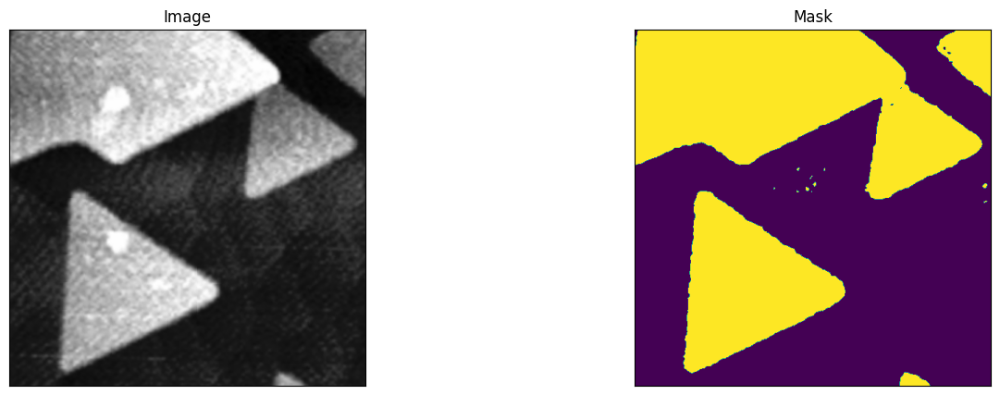

In [5]:
### validation data

n_to_show = 1
random_index = np.random.choice(np.arange(len(valid_images)), n_to_show, replace=False)

# we need to remove pre_processing to see the data
visualize_dataset = pmm.io.Dataset(
    images=[valid_images[it] for it in random_index],
    masks=[valid_masks[it] for it in random_index],
    class_values=class_values,
    augmentation=get_validation_augmentation(),
)

for im, mask in visualize_dataset:
    pmm.util.visualize(
        image=im,
        mask=mask.squeeze(),
    )

In [9]:
state = pmm.segmentation_training.train_segmentation_model(
    model=model,
    architecture=architecture,
    encoder=encoder,
    train_dataset=training_dataset,
    validation_dataset=validation_dataset,
    class_values=class_values,
    patience=30,
    lr=1e-4,# 2e-4 is the best
    batch_size=6,
    val_batch_size=6,
    save_folder='Models',
    save_name='SEG50.pth.tar'
)


Epoch: 0, lr: 0.00010000, time: 0.00 seconds, patience step: 0, best iou: 0.0000
train:   0%|                                            | 0/149 [00:00<?, ?it/s]

/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


train: 100%|█| 149/149 [01:25<00:00,  1.75it/s, DiceBCELoss - 0.5744, iou_score 
valid: 100%|█| 17/17 [00:04<00:00,  4.15it/s, DiceBCELoss - 0.5079, iou_score - 
Best model saved!

Epoch: 1, lr: 0.00010000, time: 90.58 seconds, patience step: 0, best iou: 0.9187
train: 100%|█| 149/149 [01:27<00:00,  1.70it/s, DiceBCELoss - 0.5459, iou_score 
valid: 100%|█| 17/17 [00:04<00:00,  4.02it/s, DiceBCELoss - 0.5024, iou_score - 

Epoch: 2, lr: 0.00010000, time: 92.85 seconds, patience step: 1, best iou: 0.9187
train: 100%|█| 149/149 [01:27<00:00,  1.70it/s, DiceBCELoss - 0.5364, iou_score 
valid: 100%|█| 17/17 [00:04<00:00,  3.74it/s, DiceBCELoss - 0.4987, iou_score - 
Best model saved!

Epoch: 3, lr: 0.00010000, time: 93.56 seconds, patience step: 0, best iou: 0.9323
train: 100%|█| 149/149 [01:26<00:00,  1.72it/s, DiceBCELoss - 0.5331, iou_score 
valid: 100%|█| 17/17 [00:04<00:00,  4.05it/s, DiceBCELoss - 0.4967, iou_score - 

Epoch: 4, lr: 0.00010000, time: 91.73 seconds, patience step: 1, b

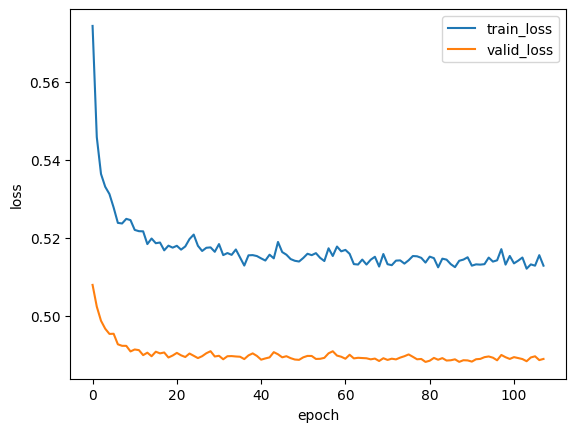

In [10]:
plt.plot(state['train_loss'], label='train_loss')
plt.plot(state['valid_loss'], label='valid_loss')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [5]:
# load best model
best_model_path = Path('Models', 'SEG50.pth.tar')
state = torch.load(best_model_path) 
best_model = pmm.segmentation_training.create_segmentation_model(
    architecture=architecture,
    encoder = encoder,
    encoder_weights=pretrained_weights, # use encoder pre-trained on micronet
    classes=1 # secondary precipitates, tertiary precipitates, matrix
    )
best_model.load_state_dict(pmm.util.remove_module_from_state_dict(state['state_dict']))
best_model.to(device).eval()

UnetPlusPlus(
  (encoder): SENetEncoder(
    (layer0): Sequential(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (pool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    )
    (layer1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [6]:
# create test dataset
test_dataset = pmm.io.Dataset(
    test_images, 
    test_masks, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_values=class_values,
)

test_dataloader = DataLoader(test_dataset)

validation_dataset = pmm.io.Dataset(
    valid_images, 
    valid_masks, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_values=class_values,
)

validation_dataloader = DataLoader(validation_dataset)


train_dataset = pmm.io.Dataset(
    train_images, 
    train_masks, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_values=class_values,
)

train_dataloader = DataLoader(train_dataset)

# dataset without transformations for image visualization
test_dataset_vis = pmm.io.Dataset(
    test_images, test_masks, 
    class_values=class_values,
)

validation_dataset_vis = pmm.io.Dataset(
    valid_images, valid_masks, 
    class_values=class_values,
)

training_dataset_vis = pmm.io.Dataset(
    train_images, train_masks, 
    class_values=class_values,
)

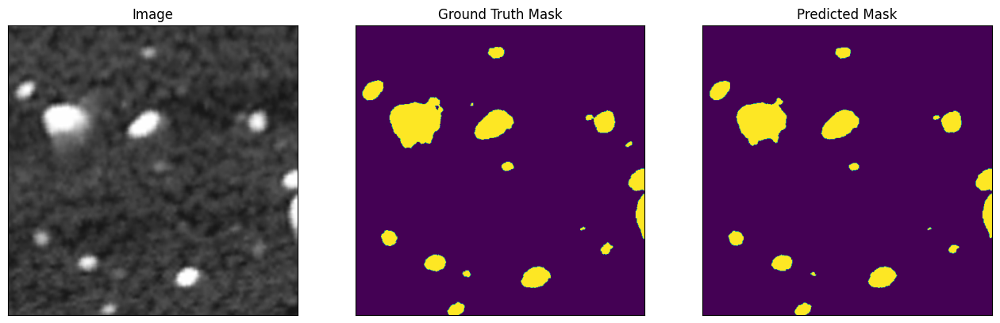

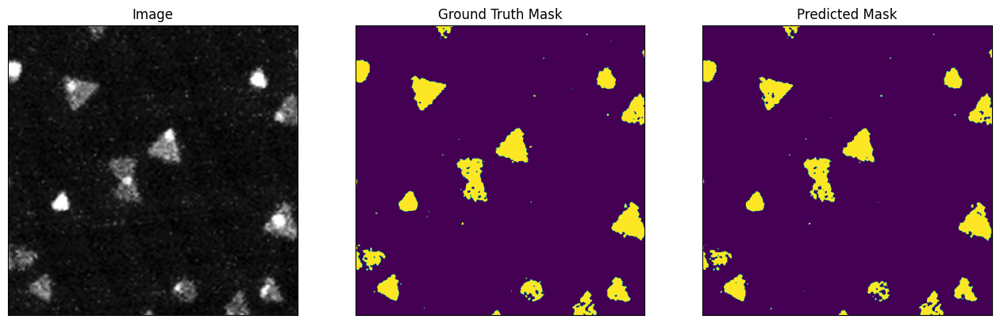

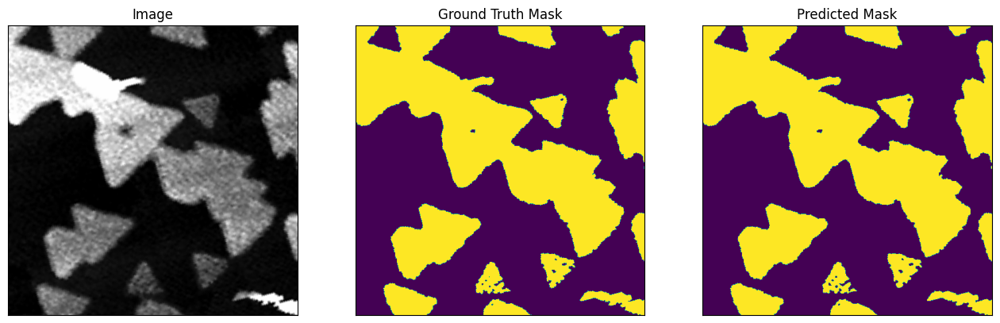

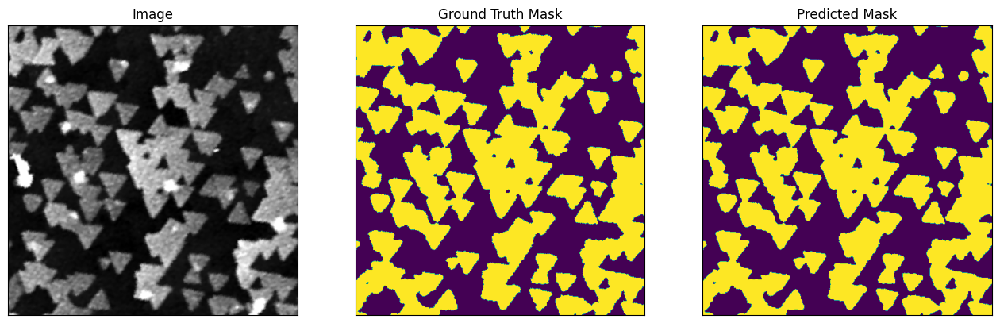

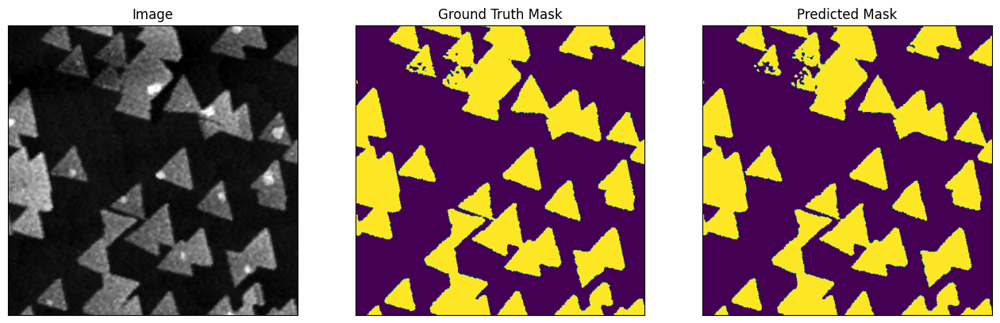

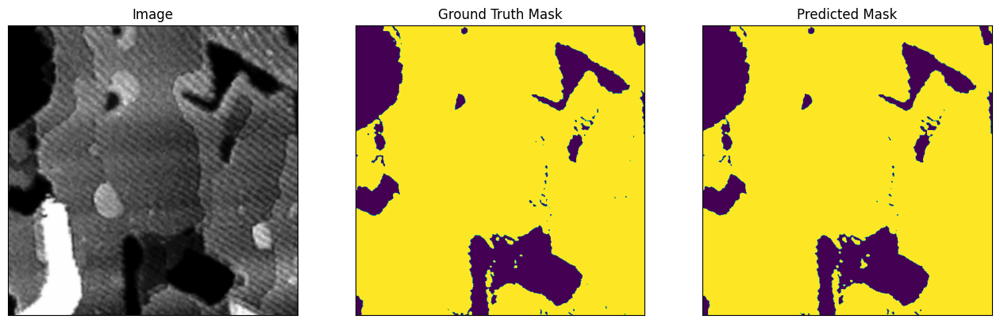

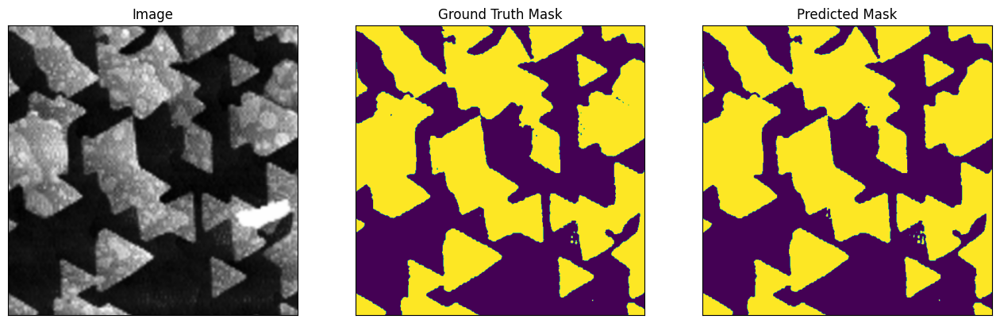

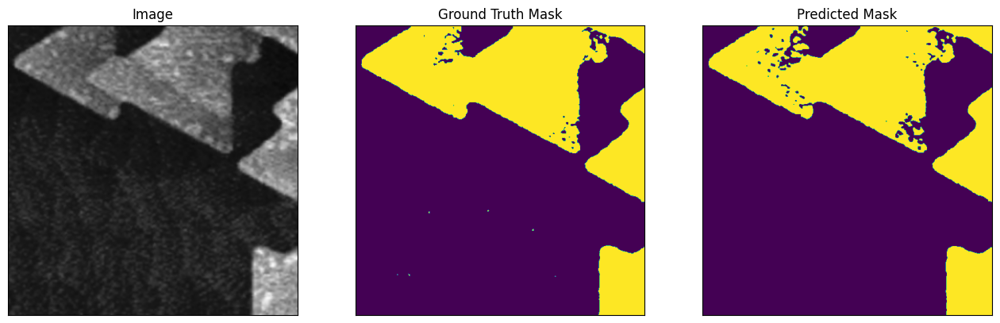

In [8]:
n_to_show = 5
random_index = [10, 20, 35, 45, 68, 75, 95, 114]#np.random.choice(np.arange(len(valid_images)), n_to_show, replace=False)

for n in random_index:
    
    image_vis = test_dataset_vis[n][0].astype('uint8')
    image, gt_mask = test_dataset[n]
    gt_mask = gt_mask[0, :, :] # remove single dimension to visualize
    
    x_tensor = torch.from_numpy(image).to(device).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
        
    pmm.util.visualize(
        image=image_vis, 
        ground_truth_mask=gt_mask,
        predicted_mask=pr_mask,
    )

In [9]:
# evaluate model on test set
loss = pmm.losses.DiceBCELoss(weight=0.5)
metrics = [smp.utils.metrics.IoU(threshold=0.9),]
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=device,
)

test_log = test_epoch.run(test_dataloader)
val_log = test_epoch.run(validation_dataloader)
train_log = test_epoch.run(train_dataloader)

valid:   2%| | 2/115 [00:00<00:06, 17.28it/s, DiceBCELoss - 0.7884, iou_score - 

/noether/s0/iam5249/anaconda3/envs/torchvision/lib/python3.10/site-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


valid: 100%|█| 115/115 [00:05<00:00, 19.86it/s, DiceBCELoss - 0.521, iou_score -
valid: 100%|█| 100/100 [00:05<00:00, 19.48it/s, DiceBCELoss - 0.4882, iou_score 
valid: 100%|█| 890/890 [00:44<00:00, 19.86it/s, DiceBCELoss - 0.5361, iou_score 


In [10]:
print(test_log)
print(val_log)
print(train_log)

{'DiceBCELoss': 0.5209903789603191, 'iou_score': 0.9219436811364216}
{'DiceBCELoss': 0.4882090866565706, 'iou_score': 0.9131922202569491}
{'DiceBCELoss': 0.5360809481880635, 'iou_score': 0.9282662771951665}


In [12]:
test_true, test_pred, test_rmse, test_r2_score = make_inference(test_dataset, test_dataset_vis)

100%|█████████████████████████████████████████| 115/115 [00:06<00:00, 17.69it/s]

RMSE:  0.019645043252532024 R2:  0.9953028135657501


RMSE = 0.019645043252532024


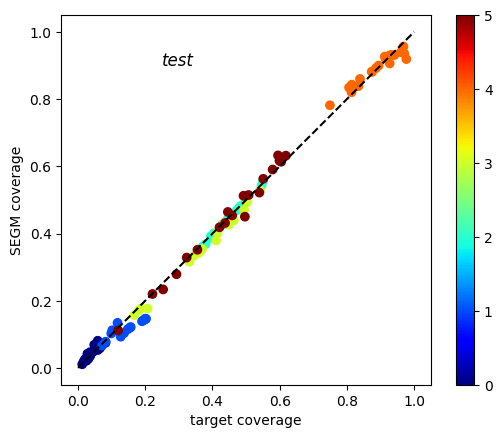

In [13]:
samples, group = np.unique([it.split('sample_')[1].split('_image_')[0] for it in test_images], return_inverse=True)
fig, ax = plt.subplots()
im = ax.scatter(test_true, test_pred, c=group, cmap='jet', vmin=0, vmax=5)
cb = plt.colorbar(im)
cb.set_ticks(sorted(set(group)))
# cb.set_ticklabels(samples)
plt.plot([0, 1], [0, 1], 'k--')

x_point = 0.25
y_point = 0.9
plt.text(x_point, y_point, 'test', style='italic', c='black',fontsize = 12)#, bbox = {'facecolor': 'white'}


print(f'RMSE = {test_rmse}')
ax.set_xlabel('target coverage')
ax.set_ylabel('SEGM coverage')
ax.set_aspect('equal')
plt.show()

In [14]:
valid_true, valid_pred, valid_rmse, val_r2_score = make_inference(validation_dataset, validation_dataset_vis)

100%|█████████████████████████████████████████| 100/100 [00:05<00:00, 17.67it/s]

RMSE:  0.023576047143672573 R2:  0.9934897889805042


RMSE = 0.023576047143672573


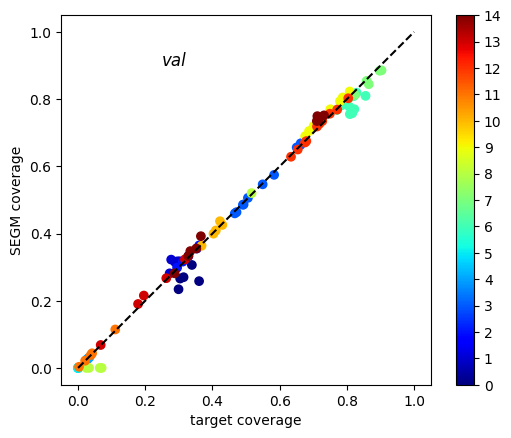

In [15]:
samples_valid, group_valid = np.unique([it.split('sample_')[1].split('_image_')[0] for it in valid_images], return_inverse=True)
fig, ax = plt.subplots()
im = ax.scatter(valid_true, valid_pred, c=group_valid, cmap='jet', vmin=0, vmax=14)
cb = plt.colorbar(im)
cb.set_ticks(sorted(set(group_valid)))
# cb.set_ticklabels(samples)
plt.plot([0, 1], [0, 1], 'k--')

x_point = 0.25
y_point = 0.9
plt.text(x_point, y_point, 'val', style='italic', c='black',fontsize = 12)#, bbox = {'facecolor': 'white'}


print(f'RMSE = {valid_rmse}')
ax.set_xlabel('target coverage')
ax.set_ylabel('SEGM coverage')
ax.set_aspect('equal')
plt.show()

In [16]:
train_true, train_pred, train_rmse, train_r2_score = make_inference(training_dataset, training_dataset_vis)

100%|█████████████████████████████████████████| 890/890 [00:50<00:00, 17.80it/s]

RMSE:  0.007352015735613221 R2:  0.9994597120505904


RMSE = 0.007352015735613221


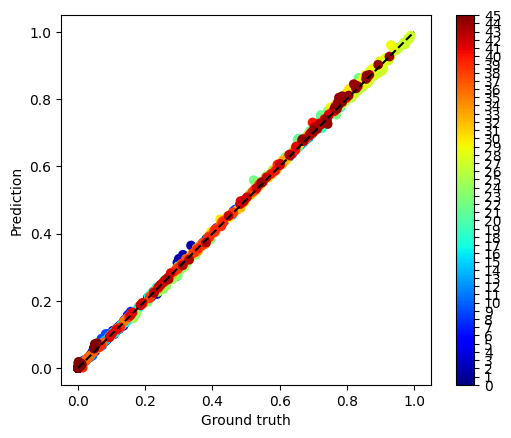

In [17]:


samples_train, group_train = np.unique([it.split('sample_')[1].split('_image_')[0] for it in train_images], return_inverse=True)
fig, ax = plt.subplots()
im = ax.scatter(train_true, train_pred, c=group_train, cmap='jet', vmin=0, vmax=45)
cb = plt.colorbar(im)
cb.set_ticks(sorted(set(group_train)))
# cb.set_ticklabels(samples)
plt.plot([0, 1], [0, 1], 'k--')

print(f'RMSE = {train_rmse}')
ax.set_xlabel('Ground truth')
ax.set_ylabel('Prediction')
ax.set_aspect('equal')


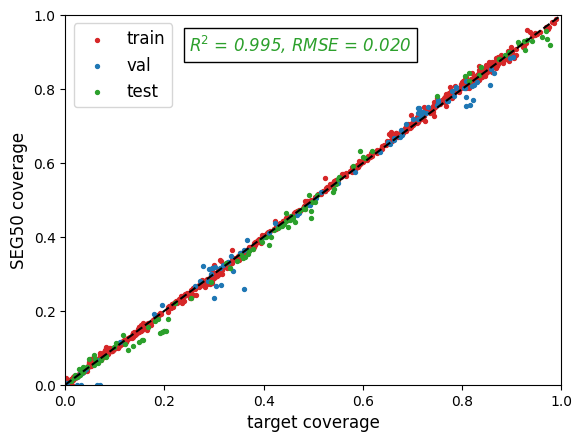

In [18]:
#Test


mpl.rcParams.update(mpl.rcParamsDefault) # this is to clear figure settings


fig, ax1 = plt.subplots()

#rc('axes', linewidth=1.2)
plt.rcParams['font.size'] = '12'


test_r2_score = r2_score(test_true, test_pred)
plt.xlabel('target coverage' , fontsize=12)#, fontweight='bold')
plt.ylabel('SEG50 coverage' , fontsize=12)#, fontweight='bold')
x_point = 0.25
y_point = 0.9
plt.text(x_point, y_point, f'R$^2$ = {test_r2_score:.3f}, RMSE = {test_rmse:.3f}', style='italic', c='tab:green', bbox = {'facecolor': 'white'}
,fontsize = 12)
#plt.text(x_point, y_point, 'R$^2$ = 0.986, RMSE = 0.046 \n MAE = 0.037 $\pm$ 0.030', style='italic', color = 'b', bbox = {'facecolor': 'white'},fontsize = 15)
plt.xlim([0, 1])
plt.ylim([0, 1])

plt.plot([0, 1], [0, 1], 'k--')
ax1.scatter(train_true, train_pred, s=8, label='train', c='tab:red')
ax1.scatter(valid_true, valid_pred, s=8, label='val', c='tab:blue')
ax1.scatter(test_true, test_pred, s=8, label='test', c='tab:green')
#ax1.set_aspect('equal')
#ax1.plot(train_true, train_true, c='black')
plt.legend()
plt.savefig("Results/SEG50_coverage_train_val_test.png", dpi=600)
plt.savefig("Results/SEG50_coverage_train_val_test.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [6]:
# do inference with the trained model
model_path = Path('Models', 'SEG50.pth.tar')
model, preprocessing_fn = pmm.segmentation_training.load_segmentation_model(model_path, classes=1)
model.to(device).eval()


UnetPlusPlus(
  (encoder): SENetEncoder(
    (layer0): Sequential(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (pool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    )
    (layer1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [7]:


#orig_data_dir2 = 'Data/2023-10-27_full'

DATA_DIR2 = 'Data/segmentation_data_full'

# define names for train / val / test subfolders
x_train_dir2 = os.path.join(DATA_DIR2, 'train')
y_train_dir2 = os.path.join(DATA_DIR2, 'train_annot')

x_valid_dir2 = os.path.join(DATA_DIR2, 'val')
y_valid_dir2 = os.path.join(DATA_DIR2, 'val_annot')

x_test_dir2 = os.path.join(DATA_DIR2, 'test')
y_test_dir2 = os.path.join(DATA_DIR2, 'test_annot')

# check results
for subdir in [x_train_dir2, y_train_dir2, x_valid_dir2, y_valid_dir2, x_test_dir2, y_test_dir2]:
    image_files = glob.glob(os.path.join(subdir, '*.png'))
    print(f'{len(image_files)} unique images in {subdir}')

178 unique images in Data/segmentation_data_full/train
178 unique images in Data/segmentation_data_full/train_annot
20 unique images in Data/segmentation_data_full/val
20 unique images in Data/segmentation_data_full/val_annot
23 unique images in Data/segmentation_data_full/test
23 unique images in Data/segmentation_data_full/test_annot


In [8]:
# how the images will be normalized. Use imagenet statistics even on micronet pre-training
#preprocessing_fn = smp.encoders.get_preprocessing_fn(encoder, 'imagenet') 

# pixel values of the annotations for each mask.
# Note: for binary classification we only need to specify the forground class.
# Note 2: cracks are also annotated seperately, but we are ignoring them in this example.
class_values = {'crystal': [1]}


# For multiclass segmentation we can pass the directory for images and masks.
# because they follow the naming convention "image1.tif" and "image1_mask.tif"
# in this case we need to pass the list of image and annotation paths explicitly
# because the annotation data does not follow that naming convention
# train_images = [os.path.join(x_train_dir, image_id) for image_id in os.listdir(x_train_dir)]
# train_masks = sorted([os.path.join(y_train_dir, image_id) for image_id in os.listdir(y_train_dir)])
train_images2 = sorted(glob.glob(os.path.join(x_train_dir2, '*.png')))
train_masks2 = sorted(glob.glob(os.path.join(y_train_dir2, '*.png')))

# valid_images = [os.path.join(x_valid_dir, image_id) for image_id in os.listdir(x_valid_dir)]
# valid_masks = [os.path.join(y_valid_dir, image_id) for image_id in os.listdir(y_valid_dir)]
valid_images2 = sorted(glob.glob(os.path.join(x_valid_dir2, '*.png')))
valid_masks2 = sorted(glob.glob(os.path.join(y_valid_dir2, '*.png')))

# test_images = [os.path.join(x_test_dir, image_id) for image_id in os.listdir(x_test_dir)]
# test_masks = [os.path.join(y_test_dir, image_id) for image_id in os.listdir(y_test_dir)]
test_images2 = sorted(glob.glob(os.path.join(x_test_dir2, '*.png')))
test_masks2 = sorted(glob.glob(os.path.join(y_test_dir2, '*.png')))

test_dataset2 = pmm.io.Dataset(
    images=test_images2,
    masks=test_masks2,
    class_values=class_values,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

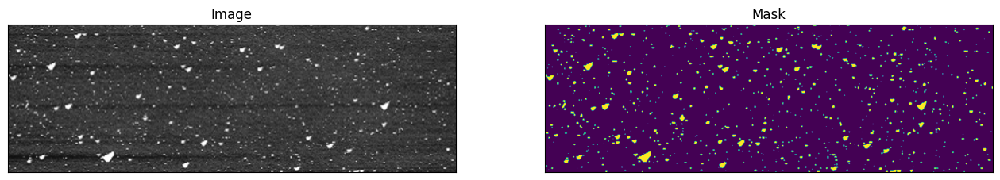

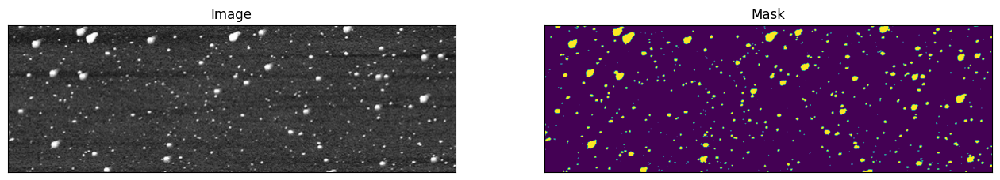

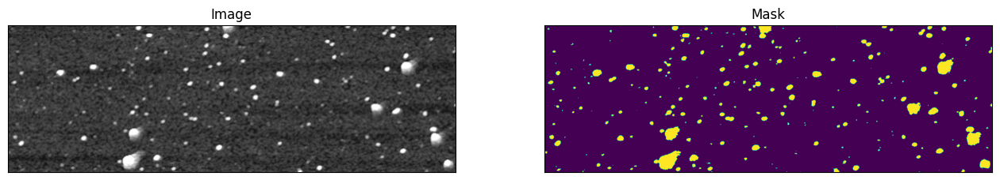

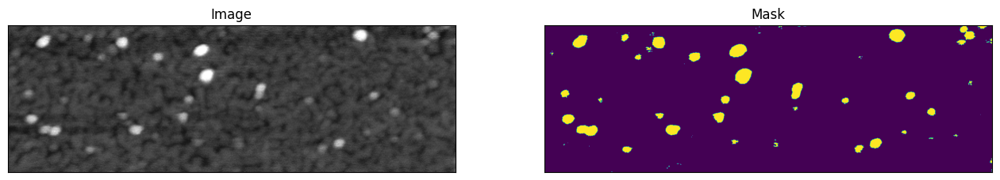

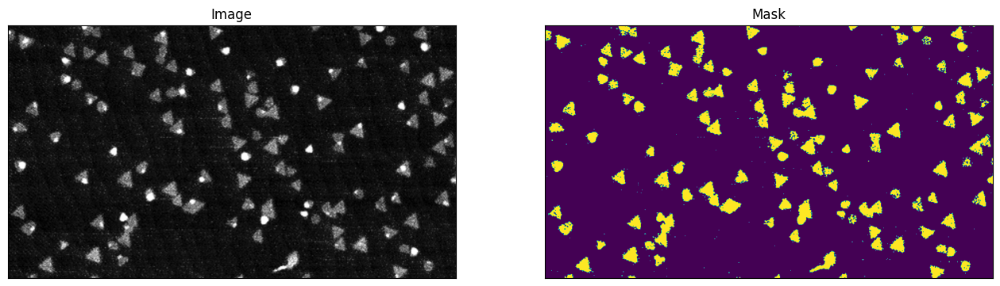

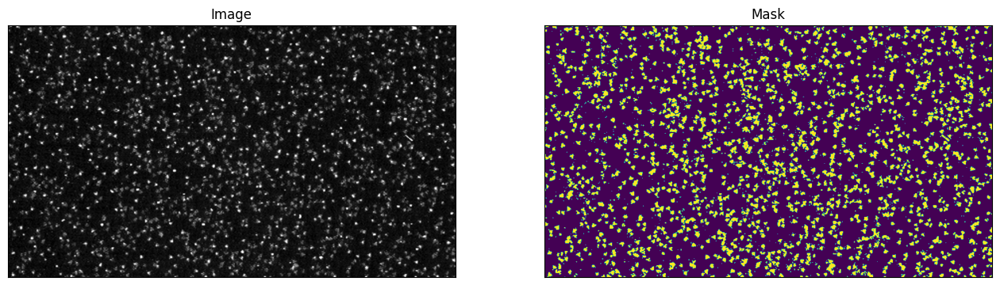

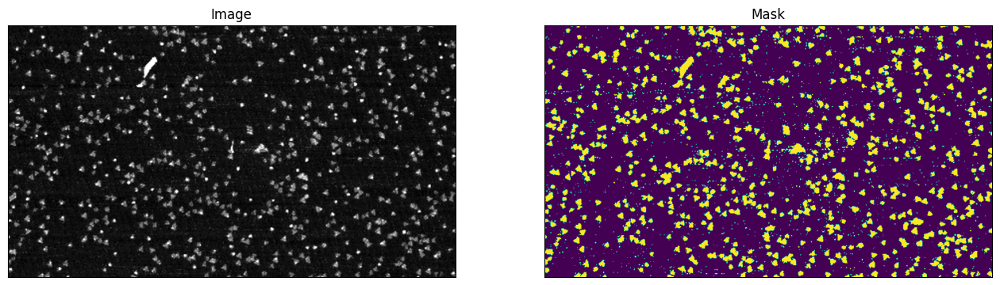

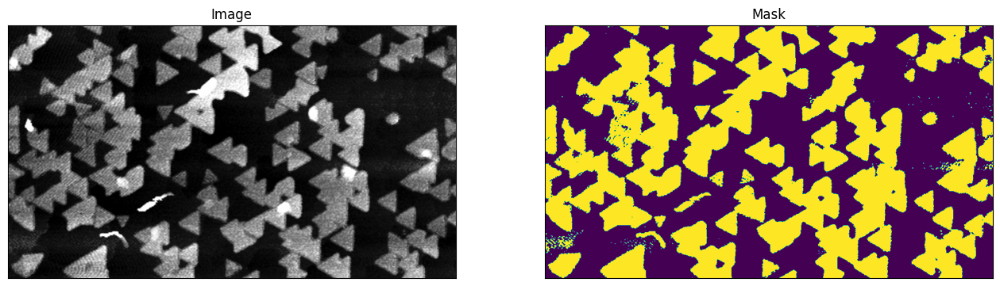

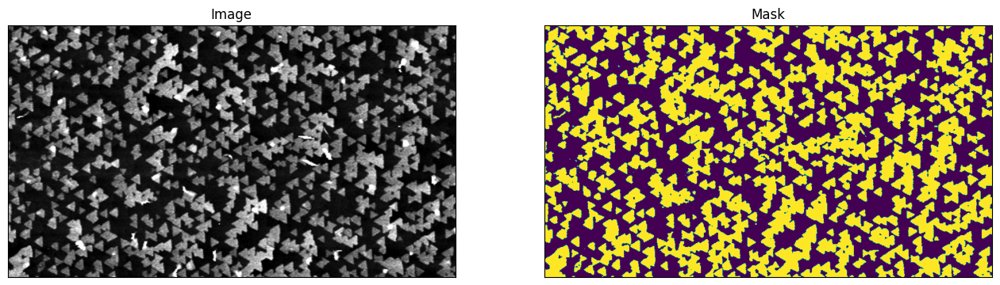

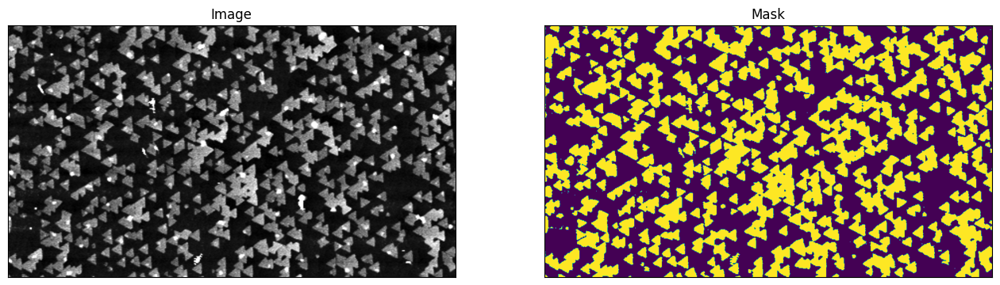

In [9]:
n_to_show = 10
#random_index = np.random.choice(np.arange(len(test_images2)), n_to_show, replace=False)
random_index = [i for i in range(10)]
# we need to remove pre_processing to see the data
visualize_dataset = pmm.io.Dataset(
    images=[test_images2[it] for it in random_index],
    masks=[test_masks2[it] for it in random_index],
    class_values=class_values,
    augmentation=get_validation_augmentation(),
)

for im, mask in visualize_dataset:
    pmm.util.visualize(
        image=im,
        mask=mask.squeeze(),
    )

In [10]:
# IoU for the patced data sets:


IOU_train_list_patch = iou_value(model, preprocessing_fn,train_images, train_masks)

IOU_valid_list_patch = iou_value(model, preprocessing_fn,valid_images, valid_masks)

IOU_test_list_patch = iou_value(model, preprocessing_fn,test_images, test_masks)

In [11]:
print('mean_train_iou: ', np.mean(IOU_train_list_patch), 'std_train_iou: ', np.std(IOU_train_list_patch))
print('mean_valid_iou: ', np.mean(IOU_valid_list_patch), 'std_test_iou: ', np.std(IOU_valid_list_patch))
print('mean_test_iou: ', np.mean(IOU_test_list_patch), 'std_test_iou: ', np.std(IOU_test_list_patch))

mean_train_iou:  0.9218229644087396 std_train_iou:  0.184639071171438
mean_valid_iou:  0.899036065079209 std_test_iou:  0.2321504012521858
mean_test_iou:  0.922093457242717 std_test_iou:  0.08728545866158692


In [12]:
im_path = test_images[12]
annot_path = test_masks[12]
im = imageio.imread(im_path)
im = img_as_ubyte(im)
truth = imageio.imread(annot_path)
#truth = img_as_ubyte(truth)
pred = segmentation_models_inference(im, model, preprocessing_fn, batch_size=6, patch_size=512, num_classes=1)

In [36]:
print(crystal.shape)

(512, 1555, 3)


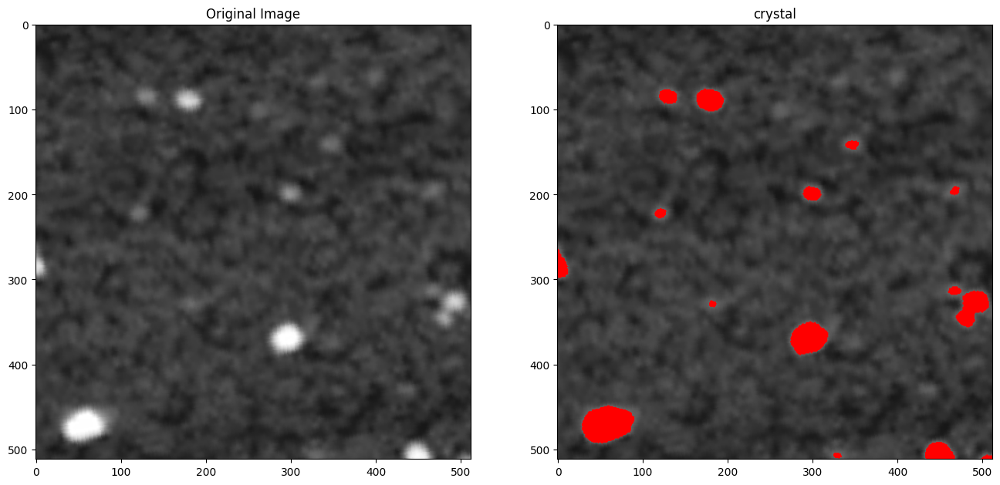

In [13]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(16,16))
crystal = im.copy()
crystal[pred[:, :, 0], 0] = 255
crystal[pred[:, :, 0], 1:] = 0
ax0.imshow(im)
ax0.set_title('Original Image')
ax1.imshow(crystal)
ax1.set_title('crystal');
plt.show()

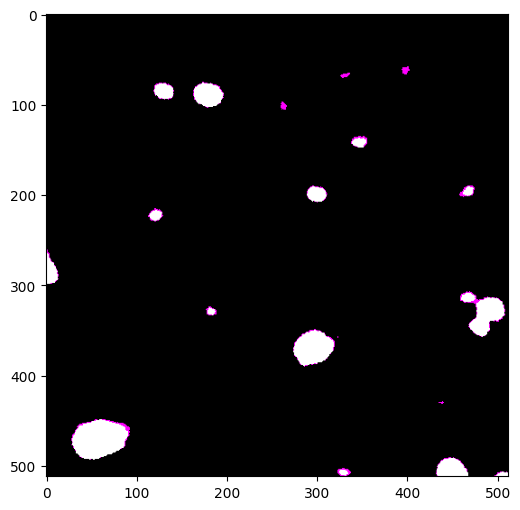

In [15]:
labels = [1]
truth = imageio.imread(annot_path)
truth = img_as_ubyte(truth)
#truth = gray2rgb(truth)
visual = pmm.segmentation_training.visualize_prediction_accuracy(pred, truth, labels)
plt.figure(figsize=(6,6))
plt.imshow(visual);
plt.show()

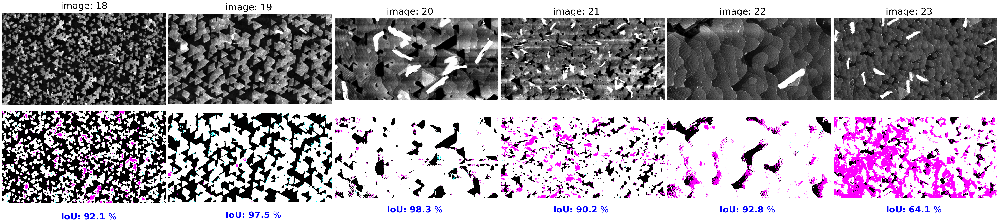

In [16]:
# full images
# 5, 11, 17
labels = [1]
rows = 2
columns = 6

fig, ax = plt.subplots(rows, columns, figsize=(54, 12))#50,10 and 54, 12
j = 0
index = [8, 19, 15, 16, 17, 18]#[9, 14, 10, 7, 21, 20]#[6, 5, 11, 12, 22, 13]#[3, 0, 1, 2, 4]
for i in range(6):
    k =i + 17#+5 + 11 + 17
    k =i #+ 5
    k = index[i]
    
#for column in range(columns):
    im_path = test_images2[k]
    annot_path = test_masks2[k]
    im = imageio.imread(im_path)
    im = img_as_ubyte(im)


    pred = segmentation_models_inference(im, model, preprocessing_fn, batch_size=4, patch_size=512, num_classes=1)
    crystal = im.copy()
    crystal[pred[:, :, 0], 0] = 255
    crystal[pred[:, :, 0], 1:] = 0
    truth = imageio.imread(annot_path)
    truth = img_as_ubyte(truth)

    visual = pmm.segmentation_training.visualize_prediction_accuracy(pred, truth, labels)

    pred1 = torch.from_numpy(pred)
    truth1 = torch.from_numpy(truth[:, :, 0]).unsqueeze(2)
    #print(truth1.shape, pred1.shape)
    IOU = (iou(pred1, truth1))
    
    x_point = pred.shape[0]/2 + 70#- 10
    y_point = 600 #pred.shape[1] # - 10
    #if i < 4:
    #    y_point =700
    #else:
    #    y_point = 600
    #image = test_X[image_order[i]].transpose(1, 2, 0)#.to(device)

    ax[j, i].imshow(im)
    #ax[j+1, i].imshow(crystal)
    ax[j+1, i].imshow(visual)
    
    ax[j, i].text(x_point, -25, f'image: {i+18}', c='black', fontsize='36', bbox=dict(fill=False, edgecolor='red', linewidth=0))
    ax[j+1, i].text(x_point, y_point, f'IoU: {IOU*100 :.1f} $\%$', c='blue', fontsize='34', weight='bold', bbox=dict(fill=False, edgecolor='red', linewidth=0))
    ax[j, i].axis('off')
    ax[j+1, i].axis('off')

#plt.savefig("Result/test_images.pdf", format="pdf", bbox_inches="tight")
fig.tight_layout()
plt.show()

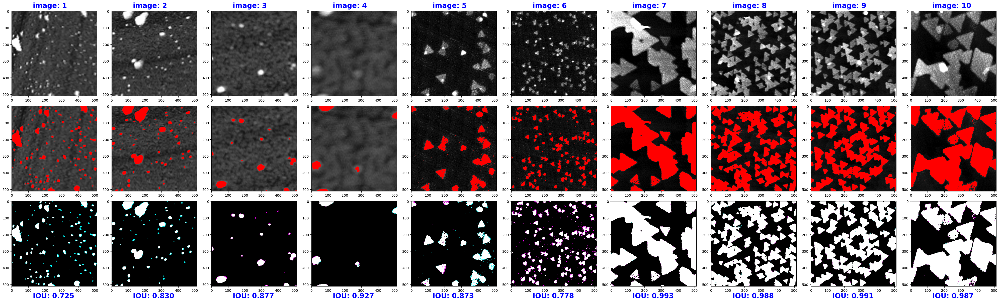

In [17]:
# image patches
rows = 3
columns = 10
fig, ax = plt.subplots(rows, columns, figsize=(40, 12))
j = 0
add = 0
for i in range(10):
    k =i #+ 60
    k += add
#for column in range(columns):
    im_path = test_images[k]
    annot_path = test_masks[k]
    im = imageio.imread(im_path)
    im = img_as_ubyte(im)


    pred = segmentation_models_inference(im, model, preprocessing_fn, batch_size=4, patch_size=512, num_classes=1)
    crystal = im.copy()
    crystal[pred[:, :, 0], 0] = 255
    crystal[pred[:, :, 0], 1:] = 0
    truth = imageio.imread(annot_path)
    truth = img_as_ubyte(truth)

    visual = pmm.segmentation_training.visualize_prediction_accuracy(pred, truth, labels)

    pred1 = torch.from_numpy(pred)
    truth1 = torch.from_numpy(truth[:, :, 0]).unsqueeze(2)
    #print(truth1.shape, pred1.shape)
    IOU = (iou(pred1, truth1))
    #print(IOU)
    x_point = pred.shape[0]/4 #+ 70#- 10
    y_point = pred.shape[1] #//2 -20#pred.shape[1]//2 - 10
    
    #image = test_X[image_order[i]].transpose(1, 2, 0)#.to(device)

    ax[j, i].imshow(im)
    ax[j+1, i].imshow(crystal)
    ax[j+2, i].imshow(visual)
    ax[j, i].text(x_point, -20, f'image: {i+1}', c='blue', fontsize='20', weight='bold', bbox=dict(fill=False, edgecolor='red', linewidth=0))
    ax[j+2, i].text(x_point, y_point+70, f'IOU: {IOU :.3f}', c='blue', fontsize='20', weight='bold', bbox=dict(fill=False, edgecolor='red', linewidth=0))

    add += 5       
#plt.savefig("Result/test_images.pdf", format="pdf", bbox_inches="tight")
fig.tight_layout()
plt.show()

In [18]:
# iou values 

IOU_test_list = iou_value(model, preprocessing_fn,test_images2, test_masks2)

In [20]:

for index, item in enumerate(IOU_test_list):
    print(index+1, 'iou: ', item)
print('mean_test_iou: ', np.mean(IOU_test_list), 'std_test_iou: ', np.std(IOU_test_list))

1 iou:  0.6616197228431702
2 iou:  0.9235690832138062
3 iou:  0.8461671471595764
4 iou:  0.8989501595497131
5 iou:  0.9273892045021057
6 iou:  0.6603091359138489
7 iou:  0.7505516409873962
8 iou:  0.851996898651123
9 iou:  0.921471118927002
10 iou:  0.9676551222801208
11 iou:  0.9332075119018555
12 iou:  0.9142846465110779
13 iou:  0.8190366625785828
14 iou:  0.9457049369812012
15 iou:  0.5771052241325378
16 iou:  0.9825693368911743
17 iou:  0.9021794199943542
18 iou:  0.9281543493270874
19 iou:  0.6413548588752747
20 iou:  0.9747283458709717
21 iou:  0.9114158749580383
22 iou:  0.9401038289070129
23 iou:  0.8937654495239258
mean_test_iou:  0.8597082469774329 std_test_iou:  0.11551515090318316


In [21]:
# the coverage
cov_truth_list, cov_pred_list = cov_value(model, preprocessing_fn,test_images2, test_masks2)

for index, item in enumerate(cov_truth_list):
    print(index+1, ' truth: ', item, 'pred: ', cov_pred_list[index])

1  truth:  0.038859023311897105 pred:  0.05873316921221865
2  truth:  0.04347245728562218 pred:  0.0466319612346873
3  truth:  0.04795041505480335 pred:  0.04609551297549968
4  truth:  0.03568010557704707 pred:  0.03720633865248227
5  truth:  0.09856051450276243 pred:  0.09947772790055248
6  truth:  0.17623561535281146 pred:  0.11639074558985667
7  truth:  0.15027003514332965 pred:  0.11281611769570012
8  truth:  0.4455693197513812 pred:  0.3801687672651934
9  truth:  0.4520310777287762 pred:  0.42245856877067256
10  truth:  0.4086682573042999 pred:  0.4022123931918412
11  truth:  0.42823938190607735 pred:  0.4006042817679558
12  truth:  0.36274547057393 pred:  0.33210344722762647
13  truth:  0.3901215193336576 pred:  0.3195734283803502
14  truth:  0.395756702942607 pred:  0.375239390807393
15  truth:  0.4228097641050584 pred:  0.24400383025291827
16  truth:  0.8483390808105469 pred:  0.8357887268066406
17  truth:  0.8653278350830078 pred:  0.7810726165771484
18  truth:  0.909265518188

In [22]:

SEG50_cov = cov_pred_list

dict = {'SEG50_cov': SEG50_cov, 'SEG50_iou': IOU_test_list}
     
df = pd.DataFrame(dict)
     
# saving the dataframe
myfile = 'Results/SEG50_cov.csv'
df.to_csv(myfile)

In [23]:
cov_abs_error = np.abs(np.subtract(cov_truth_list,cov_pred_list))

for index, item in enumerate(cov_abs_error):
    print(index+1, ' abs_erro: ', item)
 
print("   ....  ")
print('MAE: ', np.mean(cov_abs_error), 'std: ', np.std(cov_abs_error))

1  abs_erro:  0.019874145900321542
2  abs_erro:  0.003159503949065119
3  abs_erro:  0.0018549020793036733
4  abs_erro:  0.0015262330754352016
5  abs_erro:  0.000917213397790051
6  abs_erro:  0.05984486976295479
7  abs_erro:  0.037453917447629534
8  abs_erro:  0.06540055248618781
9  abs_erro:  0.02957250895810365
10  abs_erro:  0.006455864112458687
11  abs_erro:  0.027635100138121538
12  abs_erro:  0.030642023346303504
13  abs_erro:  0.07054809095330739
14  abs_erro:  0.020517312135214016
15  abs_erro:  0.1788059338521401
16  abs_erro:  0.01255035400390625
17  abs_erro:  0.08425521850585938
18  abs_erro:  0.06512832641601562
19  abs_erro:  0.3334369659423828
20  abs_erro:  0.010843716505894996
21  abs_erro:  0.024137282754010725
22  abs_erro:  0.0050659833869239335
23  abs_erro:  0.03864889705882357
   ....  
MAE:  0.049055431137745825 std:  0.0719937669750146


In [24]:
mean_IOU = np.mean(IOU_test_list)
print(mean_IOU)

0.8597082469774329


In [13]:
pred_mae = mae(cov_truth_list, cov_pred_list)
pred_rmse = np.sqrt(mse(cov_truth_list,cov_pred_list))
r2_score = r2_score(cov_truth_list, cov_pred_list)

print('mae: ', pred_mae, 'rmse: ', pred_rmse, 'r2_score: ', r2_score)

mae:  0.049055431137745825 rmse:  0.08711795341583058 r2_score:  0.8982890143868841
